In [2]:
import pandas as pd

# Load the dataset
data_path = '/content/lung_cancer_data.csv'  # Replace with the actual path to your dataset
lung_cancer_data = pd.read_csv(data_path)

In [3]:
# Display the first few rows to understand the structure
print(lung_cancer_data.head())

# General information about the dataset
print(lung_cancer_data.info())

# Summary statistics for numerical columns
print(lung_cancer_data.describe())

# Check for missing values
print(lung_cancer_data.isnull().sum())

# Assuming the dataset is already loaded into a DataFrame named 'lung_cancer_data'
lung_cancer_data.drop('Patient_ID', axis=1, inplace=True)

# Verify that the column has been removed by displaying the updated DataFrame's columns
print(lung_cancer_data.columns)


    Patient_ID  Age  Gender Smoking_History  Tumor_Size_mm Tumor_Location  \
0  Patient0000   68    Male  Current Smoker      81.678677     Lower Lobe   
1  Patient0001   58    Male    Never Smoked      78.448272     Lower Lobe   
2  Patient0002   44    Male   Former Smoker      67.714305     Lower Lobe   
3  Patient0003   72    Male  Current Smoker      70.806008     Lower Lobe   
4  Patient0004   37  Female    Never Smoked      87.272433     Lower Lobe   

       Stage          Treatment  Survival_Months         Ethnicity  ...  \
0  Stage III            Surgery               44          Hispanic  ...   
1    Stage I  Radiation Therapy              101         Caucasian  ...   
2    Stage I       Chemotherapy               69  African American  ...   
3  Stage III       Chemotherapy               95  African American  ...   
4   Stage IV  Radiation Therapy              105             Asian  ...   

  Alanine_Aminotransferase_Level Aspartate_Aminotransferase_Level  \
0                

## Handling Missing Values

In [4]:
# Impute numerical missing values with the mean
for column in lung_cancer_data.select_dtypes(include=['int64', 'float64']).columns:
    lung_cancer_data[column].fillna(lung_cancer_data[column].mean(), inplace=True)

# If there are categorical missing values, you might opt to fill with the mode (most frequent value)
for column in lung_cancer_data.select_dtypes(include=['object']).columns:
    lung_cancer_data[column].fillna(lung_cancer_data[column].mode()[0], inplace=True)

## Check for Duplicate Records

In [5]:
# Count the number of duplicate rows in the dataset
duplicate_rows = lung_cancer_data.duplicated().sum()
print(f"Number of duplicate rows: {duplicate_rows}")

Number of duplicate rows: 0


## Checking for Outliers

In [6]:
import pandas as pd

# Example DataFrame loading if needed
# lung_cancer_data = pd.read_csv('your_dataset.csv')

def cap_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Capping the outliers
    df[column] = df[column].clip(lower=lower_bound, upper=upper_bound)

# List of numerical columns to apply the IQR capping
numerical_cols = ['Age', 'Tumor_Size_mm', 'Survival_Months', 'Blood_Pressure_Systolic', 'Blood_Pressure_Diastolic', 'Blood_Pressure_Pulse',
                  'Hemoglobin_Level', 'White_Blood_Cell_Count', 'Platelet_Count', 'Albumin_Level', 'Alkaline_Phosphatase_Level',
                  'Alanine_Aminotransferase_Level', 'Aspartate_Aminotransferase_Level', 'Creatinine_Level', 'LDH_Level',
                  'Calcium_Level', 'Phosphorus_Level', 'Glucose_Level', 'Potassium_Level', 'Sodium_Level', 'Smoking_Pack_Years']

# Applying the capping function to each numerical column
for col in numerical_cols:
    cap_outliers(lung_cancer_data, col)

# Optional: Display summary statistics or plot boxplots to verify the capping effect
print(lung_cancer_data.describe())

                Age  Tumor_Size_mm  Survival_Months  Performance_Status  \
count  23658.000000   23658.000000     23658.000000        23658.000000   
mean      54.439344      55.383736        59.863809            1.999915   
std       14.396386      26.004354        34.246042            1.413675   
min       30.000000      10.004279         1.000000            0.000000   
25%       42.000000      32.972797        30.000000            1.000000   
50%       54.000000      55.296297        60.000000            2.000000   
75%       67.000000      78.190014        89.000000            3.000000   
max       79.000000      99.990554       119.000000            4.000000   

       Blood_Pressure_Systolic  Blood_Pressure_Diastolic  \
count             23658.000000              23658.000000   
mean                134.462381                 84.475780   
std                  26.020492                 14.409826   
min                  90.000000                 60.000000   
25%                 112.

## Data Type Conversion

In [7]:
import pandas as pd

# Example DataFrame loading if needed
# lung_cancer_data = pd.read_csv('your_dataset.csv')

# Converting categorical columns to category data type
categorical_columns = ['Gender', 'Smoking_History', 'Tumor_Location', 'Stage', 'Treatment', 'Ethnicity',
                       'Insurance_Type', 'Family_History', 'Comorbidity_Diabetes', 'Comorbidity_Hypertension',
                       'Comorbidity_Heart_Disease', 'Comorbidity_Chronic_Lung_Disease', 'Comorbidity_Kidney_Disease',
                       'Comorbidity_Autoimmune_Disease', 'Comorbidity_Other']
for col in categorical_columns:
    lung_cancer_data[col] = lung_cancer_data[col].astype('category')

# Converting integer columns if they are mistakenly float due to NaN handling or similar
integer_columns = ['Age', 'Performance_Status', 'Blood_Pressure_Systolic', 'Blood_Pressure_Diastolic',
                   'Blood_Pressure_Pulse', 'Survival_Months']  # Assuming these do not actually need float precision
for col in integer_columns:
    lung_cancer_data[col] = lung_cancer_data[col].astype('int64')

# Adjusting float precision if needed
float_columns = ['Tumor_Size_mm', 'Hemoglobin_Level', 'White_Blood_Cell_Count', 'Platelet_Count', 'Albumin_Level',
                 'Alkaline_Phosphatase_Level', 'Alanine_Aminotransferase_Level', 'Aspartate_Aminotransferase_Level',
                 'Creatinine_Level', 'LDH_Level', 'Calcium_Level', 'Phosphorus_Level', 'Glucose_Level',
                 'Potassium_Level', 'Sodium_Level', 'Smoking_Pack_Years']
for col in float_columns:
    lung_cancer_data[col] = lung_cancer_data[col].astype('float32')  # Adjusting to float32 for less precision if acceptable

# Verifying changes
print(lung_cancer_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23658 entries, 0 to 23657
Data columns (total 37 columns):
 #   Column                            Non-Null Count  Dtype   
---  ------                            --------------  -----   
 0   Age                               23658 non-null  int64   
 1   Gender                            23658 non-null  category
 2   Smoking_History                   23658 non-null  category
 3   Tumor_Size_mm                     23658 non-null  float32 
 4   Tumor_Location                    23658 non-null  category
 5   Stage                             23658 non-null  category
 6   Treatment                         23658 non-null  category
 7   Survival_Months                   23658 non-null  int64   
 8   Ethnicity                         23658 non-null  category
 9   Insurance_Type                    23658 non-null  category
 10  Family_History                    23658 non-null  category
 11  Comorbidity_Diabetes              23658 non-null  cate

# Exploratory Data Analysis

In [8]:
import pandas as pd

# Assuming your DataFrame is loaded as `lung_cancer_data`

# Generate summary statistics for numerical data
numerical_summary = lung_cancer_data.describe()

# Because you have a mix of data types and many categories, you may also want to see a summary of the categorical data:
categorical_summary = lung_cancer_data.describe(include=['category'])

print("Numerical Data Summary:\n", numerical_summary)
print("\nCategorical Data Summary:\n", categorical_summary)

Numerical Data Summary:
                 Age  Tumor_Size_mm  Survival_Months  Performance_Status  \
count  23658.000000   23658.000000     23658.000000        23658.000000   
mean      54.439344      55.383739        59.863809            1.999915   
std       14.396386      26.004354        34.246042            1.413675   
min       30.000000      10.004278         1.000000            0.000000   
25%       42.000000      32.972797        30.000000            1.000000   
50%       54.000000      55.296297        60.000000            2.000000   
75%       67.000000      78.190016        89.000000            3.000000   
max       79.000000      99.990555       119.000000            4.000000   

       Blood_Pressure_Systolic  Blood_Pressure_Diastolic  \
count             23658.000000              23658.000000   
mean                134.462381                 84.475780   
std                  26.020492                 14.409826   
min                  90.000000                 60.000000   

## Univariate Analysis

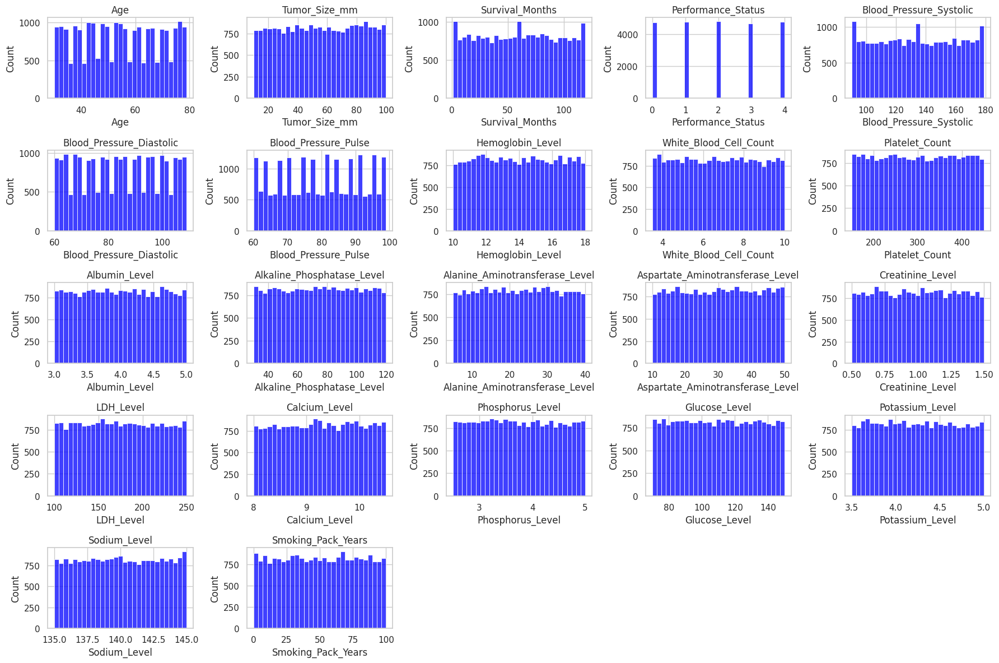

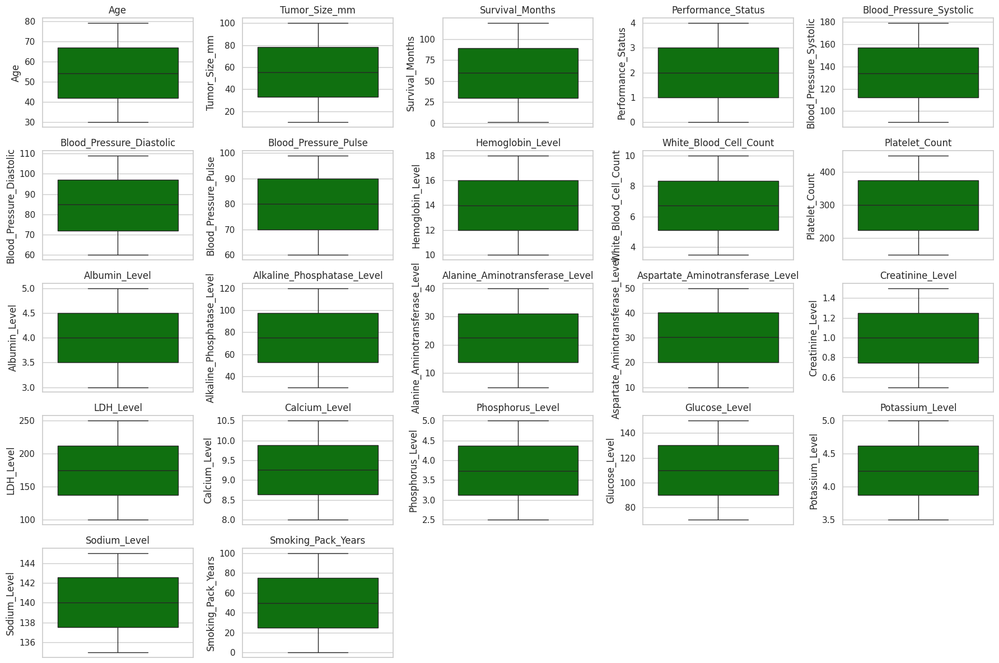

<ipython-input-9-dce27258eed7>:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=lung_cancer_data[col], palette='Set3')
<ipython-input-9-dce27258eed7>:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=lung_cancer_data[col], palette='Set3')
<ipython-input-9-dce27258eed7>:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=lung_cancer_data[col], palette='Set3')
<ipython-input-9-dce27258eed7>:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` an

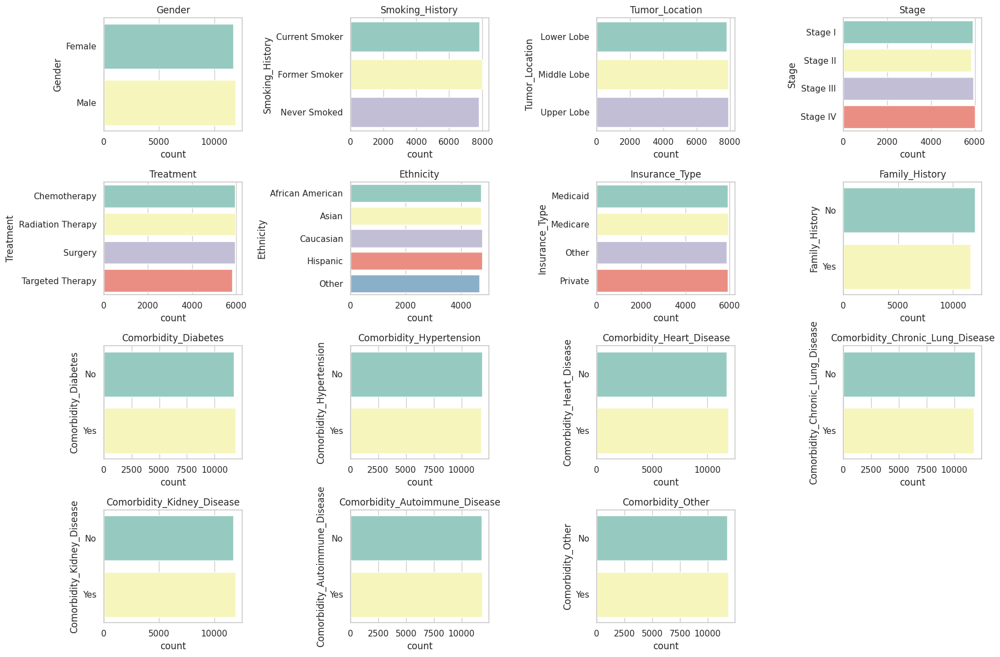

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

# Setting aesthetics for seaborn
sns.set(style="whitegrid")

# Numerical columns list from your dataset
numerical_columns = ['Age', 'Tumor_Size_mm', 'Survival_Months', 'Performance_Status',
                     'Blood_Pressure_Systolic', 'Blood_Pressure_Diastolic', 'Blood_Pressure_Pulse',
                     'Hemoglobin_Level', 'White_Blood_Cell_Count', 'Platelet_Count', 'Albumin_Level',
                     'Alkaline_Phosphatase_Level', 'Alanine_Aminotransferase_Level', 'Aspartate_Aminotransferase_Level',
                     'Creatinine_Level', 'LDH_Level', 'Calcium_Level', 'Phosphorus_Level', 'Glucose_Level',
                     'Potassium_Level', 'Sodium_Level', 'Smoking_Pack_Years']

# Plotting histograms for numerical columns
plt.figure(figsize=(18, 12))
for i, col in enumerate(numerical_columns):
    plt.subplot(5, 5, i + 1)  # Adjust grid depending on the number of columns
    sns.histplot(lung_cancer_data[col], kde=False, color='blue')
    plt.title(col)
    plt.tight_layout()

plt.show()

# Plotting boxplots for numerical columns
plt.figure(figsize=(18, 12))
for i, col in enumerate(numerical_columns):
    plt.subplot(5, 5, i + 1)  # Adjust grid depending on the number of columns
    sns.boxplot(y=lung_cancer_data[col], color='green')
    plt.title(col)
    plt.tight_layout()

plt.show()

# Categorical columns list from your dataset
categorical_columns = ['Gender', 'Smoking_History', 'Tumor_Location', 'Stage', 'Treatment', 'Ethnicity',
                       'Insurance_Type', 'Family_History', 'Comorbidity_Diabetes', 'Comorbidity_Hypertension',
                       'Comorbidity_Heart_Disease', 'Comorbidity_Chronic_Lung_Disease', 'Comorbidity_Kidney_Disease',
                       'Comorbidity_Autoimmune_Disease', 'Comorbidity_Other']

# Plotting bar charts for categorical columns
plt.figure(figsize=(18, 12))
for i, col in enumerate(categorical_columns):
    plt.subplot(4, 4, i + 1)  # Adjust grid depending on the number of columns
    sns.countplot(y=lung_cancer_data[col], palette='Set3')
    plt.title(col)
    plt.tight_layout()

plt.show()

<ipython-input-10-34885fdb5f87>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(y=lung_cancer_data[col], palette='Set3')
<ipython-input-10-34885fdb5f87>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(y=lung_cancer_data[col], palette='Set3')
<ipython-input-10-34885fdb5f87>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(y=lung_cancer_data[col], palette='Set3')
<ipython-input-10-34885fdb5f87>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` v

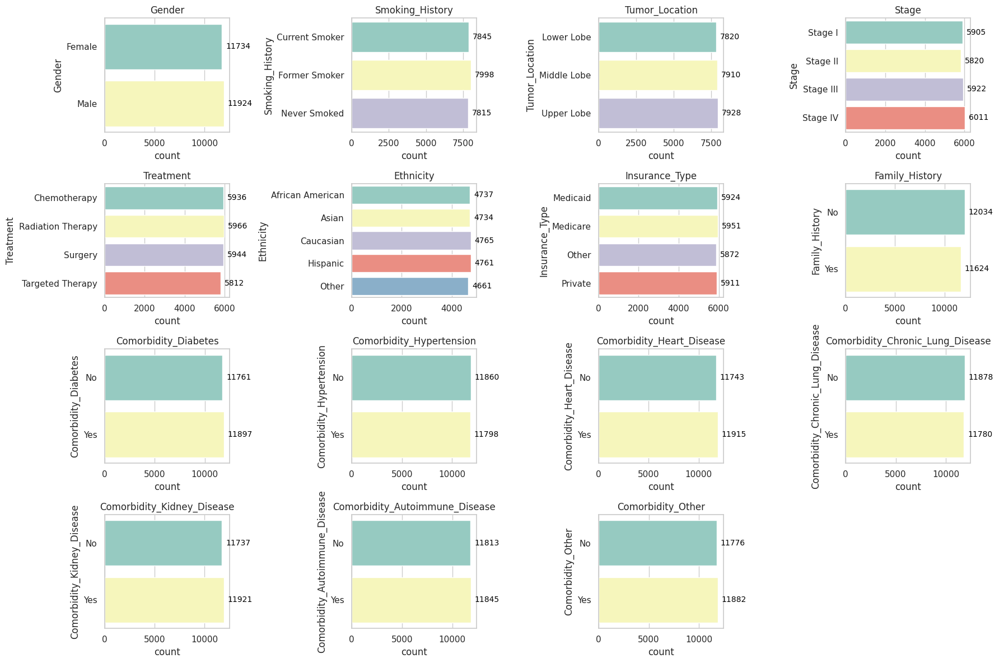

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

# Setting aesthetics for seaborn
sns.set(style="whitegrid")

# Data preparation and selection may vary; assuming lung_cancer_data is your DataFrame
categorical_columns = ['Gender', 'Smoking_History', 'Tumor_Location', 'Stage', 'Treatment', 'Ethnicity',
                       'Insurance_Type', 'Family_History', 'Comorbidity_Diabetes', 'Comorbidity_Hypertension',
                       'Comorbidity_Heart_Disease', 'Comorbidity_Chronic_Lung_Disease', 'Comorbidity_Kidney_Disease',
                       'Comorbidity_Autoimmune_Disease', 'Comorbidity_Other']

plt.figure(figsize=(18, 12))

# Plotting bar charts for each categorical column with counts
for i, col in enumerate(categorical_columns):
    plt.subplot(4, 4, i + 1)  # Adjust grid depending on the number of columns
    ax = sns.countplot(y=lung_cancer_data[col], palette='Set3')
    plt.title(col)

    # Add counts above the bars
    for p in ax.patches:
        ax.annotate(f'{int(p.get_width())}', (p.get_x() + p.get_width(), p.get_y() + p.get_height() / 2),
                    ha='left', va='center', fontsize=10, color='black', xytext=(5, 0), textcoords='offset points')

    plt.tight_layout()

plt.show()

## Bivariate Analysis

## Bivariate Analysis with Survival Time

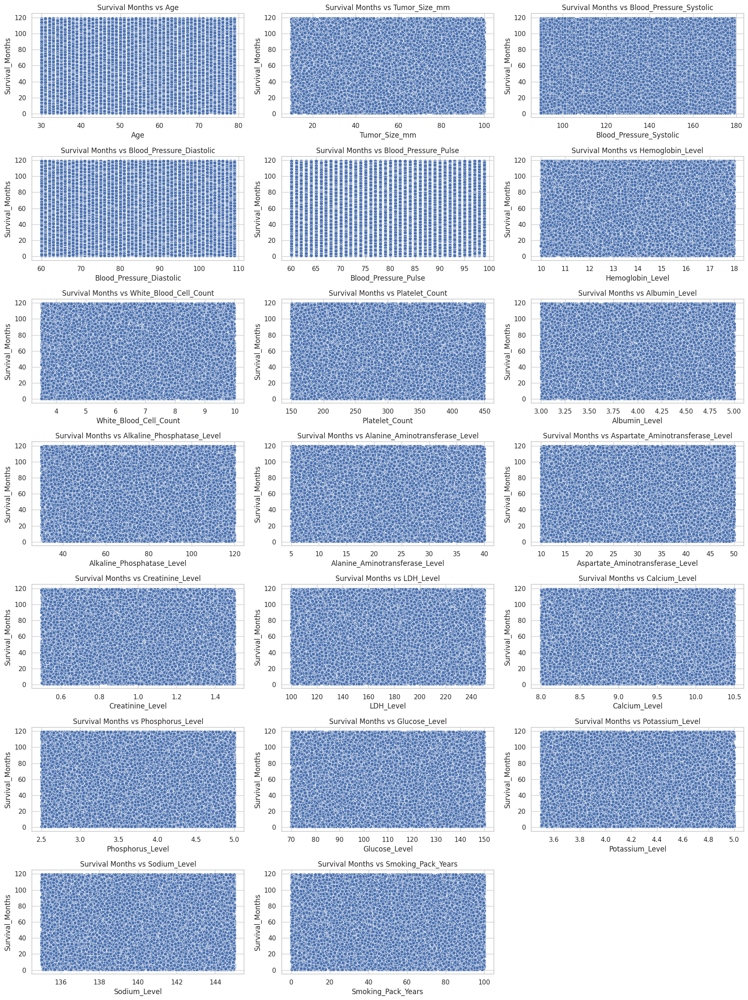

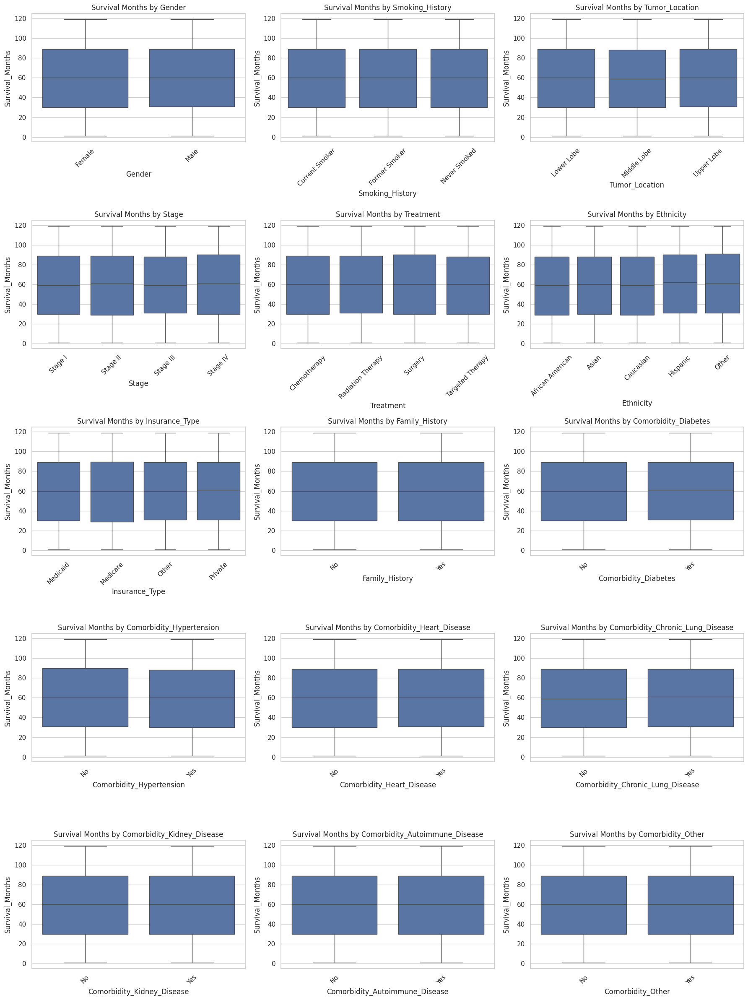

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming lung_cancer_data is your DataFrame and already loaded.

# List all columns to consider for the analysis
numerical_columns = ['Age', 'Tumor_Size_mm', 'Blood_Pressure_Systolic', 'Blood_Pressure_Diastolic',
                     'Blood_Pressure_Pulse', 'Hemoglobin_Level', 'White_Blood_Cell_Count', 'Platelet_Count',
                     'Albumin_Level', 'Alkaline_Phosphatase_Level', 'Alanine_Aminotransferase_Level',
                     'Aspartate_Aminotransferase_Level', 'Creatinine_Level', 'LDH_Level', 'Calcium_Level',
                     'Phosphorus_Level', 'Glucose_Level', 'Potassium_Level', 'Sodium_Level', 'Smoking_Pack_Years']

# Numerical Variables Analysis
plt.figure(figsize=(18, 24))
for i, col in enumerate(numerical_columns):
    plt.subplot(7, 3, i + 1)  # Adjust grid size based on the number of numerical columns
    sns.scatterplot(x=col, y='Survival_Months', data=lung_cancer_data)
    plt.title(f'Survival Months vs {col}')

plt.tight_layout()
plt.show()

# List of categorical columns
categorical_columns = ['Gender', 'Smoking_History', 'Tumor_Location', 'Stage', 'Treatment', 'Ethnicity',
                       'Insurance_Type', 'Family_History', 'Comorbidity_Diabetes', 'Comorbidity_Hypertension',
                       'Comorbidity_Heart_Disease', 'Comorbidity_Chronic_Lung_Disease', 'Comorbidity_Kidney_Disease',
                       'Comorbidity_Autoimmune_Disease', 'Comorbidity_Other']

# Categorical Variables Analysis
plt.figure(figsize=(18, 24))
for i, col in enumerate(categorical_columns):
    plt.subplot(5, 3, i + 1)  # Adjust grid size based on the number of categorical columns
    sns.boxplot(x=col, y='Survival_Months', data=lung_cancer_data)
    plt.title(f'Survival Months by {col}')
    plt.xticks(rotation=45)  # Rotate x labels for better readability if necessary

plt.tight_layout()
plt.show()

## Bivariate Analysis with Tumor Stage

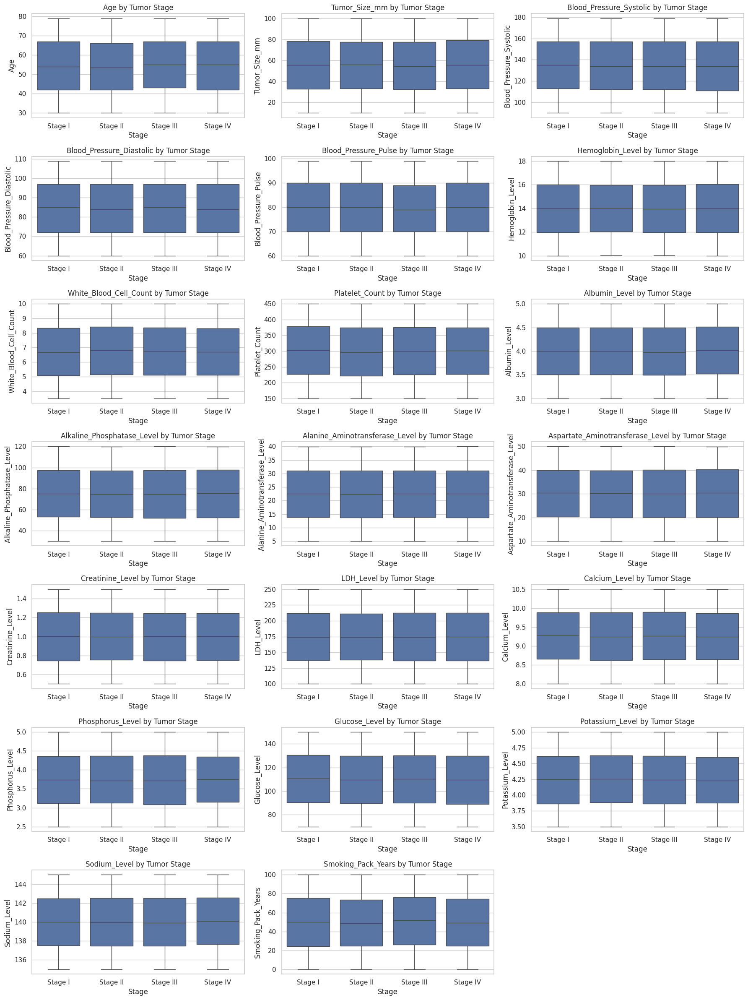

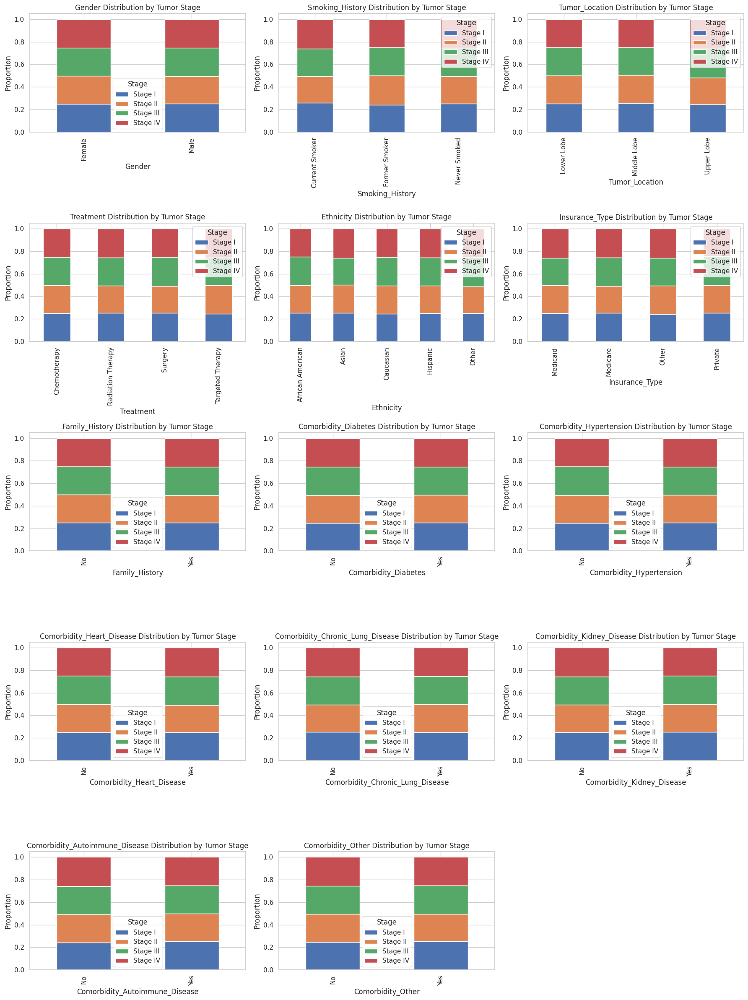

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming lung_cancer_data is your DataFrame and already loaded.

# List all columns to consider for the analysis
numerical_columns = ['Age', 'Tumor_Size_mm', 'Blood_Pressure_Systolic', 'Blood_Pressure_Diastolic',
                     'Blood_Pressure_Pulse', 'Hemoglobin_Level', 'White_Blood_Cell_Count', 'Platelet_Count',
                     'Albumin_Level', 'Alkaline_Phosphatase_Level', 'Alanine_Aminotransferase_Level',
                     'Aspartate_Aminotransferase_Level', 'Creatinine_Level', 'LDH_Level', 'Calcium_Level',
                     'Phosphorus_Level', 'Glucose_Level', 'Potassium_Level', 'Sodium_Level', 'Smoking_Pack_Years']

# Numerical Variables Analysis
plt.figure(figsize=(18, 24))
for i, col in enumerate(numerical_columns):
    plt.subplot(7, 3, i + 1)  # Adjust grid size based on the number of numerical columns
    sns.boxplot(x='Stage', y=col, data=lung_cancer_data)
    plt.title(f'{col} by Tumor Stage')

plt.tight_layout()
plt.show()

# List of categorical columns excluding 'Stage'
categorical_columns = ['Gender', 'Smoking_History', 'Tumor_Location', 'Treatment', 'Ethnicity',
                       'Insurance_Type', 'Family_History', 'Comorbidity_Diabetes', 'Comorbidity_Hypertension',
                       'Comorbidity_Heart_Disease', 'Comorbidity_Chronic_Lung_Disease', 'Comorbidity_Kidney_Disease',
                       'Comorbidity_Autoimmune_Disease', 'Comorbidity_Other']

# Categorical Variables Analysis
plt.figure(figsize=(18, 24))
for i, col in enumerate(categorical_columns):
    plt.subplot(5, 3, i + 1)  # Adjust grid size based on the number of categorical columns
    cross_tab = pd.crosstab(lung_cancer_data[col], lung_cancer_data['Stage'], normalize='index')
    cross_tab.plot(kind='bar', stacked=True, ax=plt.gca())
    plt.title(f'{col} Distribution by Tumor Stage')
    plt.ylabel('Proportion')

plt.tight_layout()
plt.show()

# Model Development for Survival Time Prediction

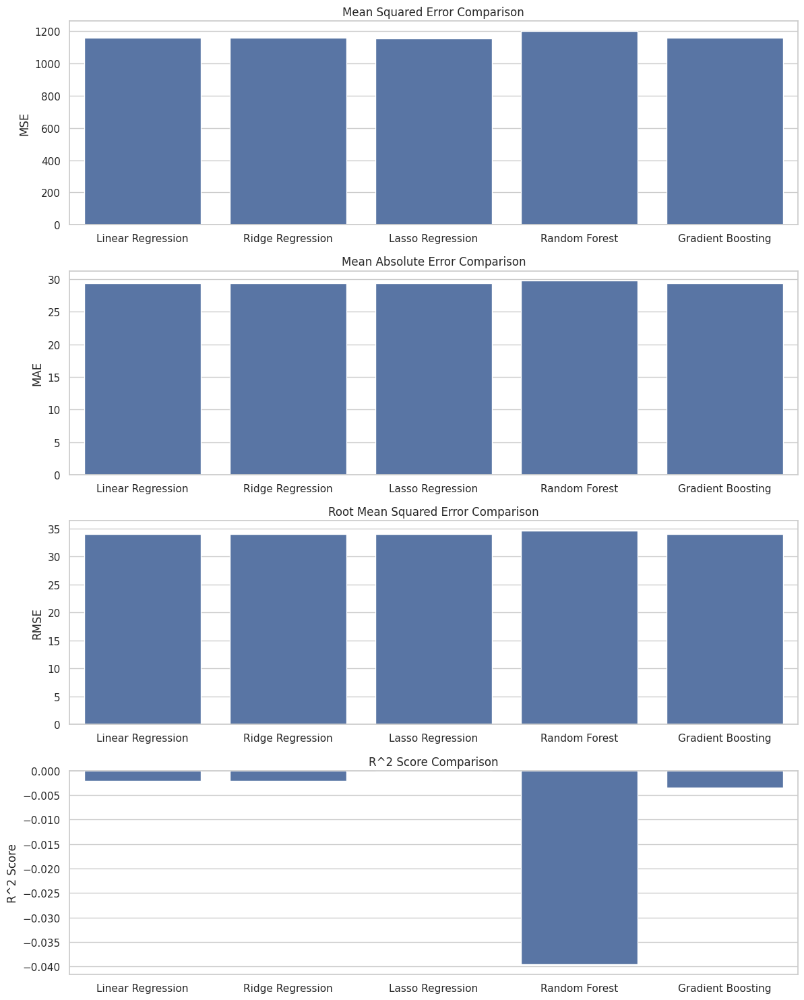

In [13]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load your dataset
# lung_cancer_data = pd.read_csv('path_to_your_data.csv')

# Define numerical and categorical columns
numerical_cols = ['Age', 'Tumor_Size_mm', 'Blood_Pressure_Systolic', 'Hemoglobin_Level', 'White_Blood_Cell_Count']
categorical_cols = ['Gender', 'Smoking_History', 'Stage', 'Treatment', 'Ethnicity']

# Features and target variable
X = lung_cancer_data[numerical_cols + categorical_cols]
y = lung_cancer_data['Survival_Months']

# Preprocessing for numerical data
numerical_transformer = StandardScaler()

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Define models
models = {
    'Linear Regression': LinearRegression(),
    'Ridge Regression': Ridge(),
    'Lasso Regression': Lasso(),
    'Random Forest': RandomForestRegressor(n_estimators=100),  # Specify n_estimators if needed
    'Gradient Boosting': GradientBoostingRegressor()
}

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Initialize dictionaries to store results
mse_results = {}
mae_results = {}
rmse_results = {}
r2_results = {}

# Evaluate each model
for name, model in models.items():
    # Create and fit the pipeline
    pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                               ('model', model)])
    pipeline.fit(X_train, y_train)
    preds = pipeline.predict(X_test)

    # Calculate metrics
    mse = mean_squared_error(y_test, preds)
    mae = mean_absolute_error(y_test, preds)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, preds)

    # Store results
    mse_results[name] = mse
    mae_results[name] = mae
    rmse_results[name] = rmse
    r2_results[name] = r2

# Plotting results
plt.figure(figsize=(12, 15))
sns.set(style="whitegrid")

# MSE Plot
plt.subplot(4, 1, 1)
sns.barplot(x=list(mse_results.keys()), y=list(mse_results.values()))
plt.title('Mean Squared Error Comparison')
plt.ylabel('MSE')

# MAE Plot
plt.subplot(4, 1, 2)
sns.barplot(x=list(mae_results.keys()), y=list(mae_results.values()))
plt.title('Mean Absolute Error Comparison')
plt.ylabel('MAE')

# RMSE Plot
plt.subplot(4, 1, 3)
sns.barplot(x=list(rmse_results.keys()), y=list(rmse_results.values()))
plt.title('Root Mean Squared Error Comparison')
plt.ylabel('RMSE')

# R^2 Plot
plt.subplot(4, 1, 4)
sns.barplot(x=list(r2_results.keys()), y=list(r2_results.values()))
plt.title('R^2 Score Comparison')
plt.ylabel('R^2 Score')

plt.tight_layout()
plt.show()

<ipython-input-14-a6756674cc4c>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(mse_results.keys()), y=list(mse_results.values()), ax=axes[0], palette=colors)
<ipython-input-14-a6756674cc4c>:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(mae_results.keys()), y=list(mae_results.values()), ax=axes[1], palette=colors)
<ipython-input-14-a6756674cc4c>:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(rmse_results.keys()), y=list(rmse_results.values()), ax=axes[2], palette=colors)
<ipython-input-14-a6756674cc4c>:50: Futur

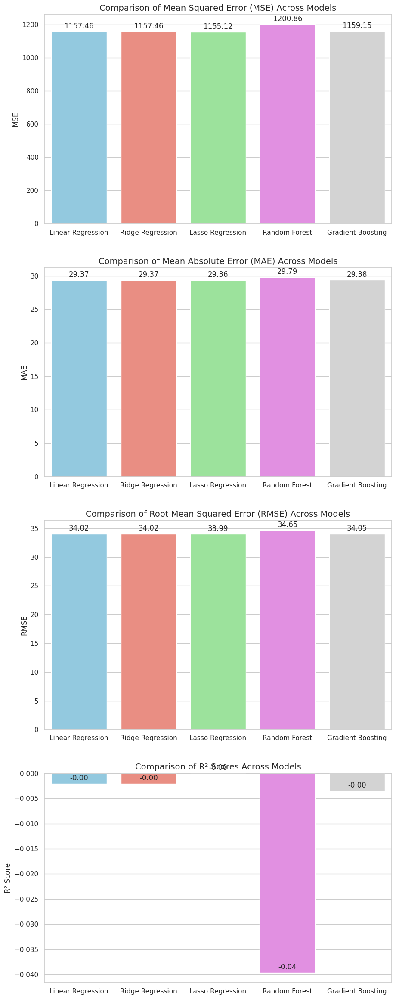

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'mse_results', 'mae_results', 'rmse_results', and 'r2_results' are already defined as dictionaries from the model evaluations

# Set up the figure and axes
fig, axes = plt.subplots(4, 1, figsize=(10, 24))  # Adjusted to include an additional plot for R²
sns.set(style="whitegrid", palette="pastel")

# Define colors for each model for consistency across plots
colors = ["skyblue", "salmon", "lightgreen", "violet", "lightgrey"]

# Mean Squared Error (MSE) Plot
sns.barplot(x=list(mse_results.keys()), y=list(mse_results.values()), ax=axes[0], palette=colors)
axes[0].set_title('Comparison of Mean Squared Error (MSE) Across Models', fontsize=14)
axes[0].set_ylabel('MSE', fontsize=12)
axes[0].set_xlabel('')
for p in axes[0].patches:
    axes[0].annotate(format(p.get_height(), '.2f'),
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha = 'center', va = 'center',
                   xytext = (0, 9),
                   textcoords = 'offset points')

# Mean Absolute Error (MAE) Plot
sns.barplot(x=list(mae_results.keys()), y=list(mae_results.values()), ax=axes[1], palette=colors)
axes[1].set_title('Comparison of Mean Absolute Error (MAE) Across Models', fontsize=14)
axes[1].set_ylabel('MAE', fontsize=12)
axes[1].set_xlabel('')
for p in axes[1].patches:
    axes[1].annotate(format(p.get_height(), '.2f'),
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha = 'center', va = 'center',
                   xytext = (0, 9),
                   textcoords = 'offset points')

# Root Mean Squared Error (RMSE) Plot
sns.barplot(x=list(rmse_results.keys()), y=list(rmse_results.values()), ax=axes[2], palette=colors)
axes[2].set_title('Comparison of Root Mean Squared Error (RMSE) Across Models', fontsize=14)
axes[2].set_ylabel('RMSE', fontsize=12)
axes[2].set_xlabel('')
for p in axes[2].patches:
    axes[2].annotate(format(p.get_height(), '.2f'),
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha = 'center', va = 'center',
                   xytext = (0, 9),
                   textcoords = 'offset points')

# R² Score Plot
sns.barplot(x=list(r2_results.keys()), y=list(r2_results.values()), ax=axes[3], palette=colors)
axes[3].set_title('Comparison of R² Scores Across Models', fontsize=14)
axes[3].set_ylabel('R² Score', fontsize=12)
axes[3].set_xlabel('')
for p in axes[3].patches:
    axes[3].annotate(format(p.get_height(), '.2f'),
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha = 'center', va = 'center',
                   xytext = (0, 9),
                   textcoords = 'offset points')

# General adjustments
plt.tight_layout(pad=3.0)
plt.show()

# Tumour Stage Classification

In [15]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns

# Load your dataset
# lung_cancer_data = pd.read_csv('path_to_your_data.csv')

# Define numerical and categorical columns
numerical_cols = ['Age', 'Tumor_Size_mm', 'Blood_Pressure_Systolic', 'Hemoglobin_Level', 'White_Blood_Cell_Count']
categorical_cols = ['Gender', 'Smoking_History', 'Treatment', 'Ethnicity']

# Features and target variable
X = lung_cancer_data[numerical_cols + categorical_cols]
y = lung_cancer_data['Stage']  # Assume 'Stage' is already properly encoded as integers

# Preprocessing for numerical data
numerical_transformer = StandardScaler()

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Define models
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'SVM': SVC(probability=True),  # Enable probability for ROC AUC
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(n_estimators=100),
    'Gradient Boosting': GradientBoostingClassifier()
}

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

# Evaluate each model
for name, model in models.items():
    pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                               ('model', model)])
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)
    y_proba = pipeline.predict_proba(X_test) if hasattr(model, "predict_proba") else None

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    if y_proba is not None:
        roc_auc = roc_auc_score(y_test, y_proba, multi_class='ovr', average='weighted')
    else:
        roc_auc = None
    conf_matrix = confusion_matrix(y_test, y_pred)

    # Print results
    print(f"{name} - Accuracy: {accuracy:.2f}, Precision: {precision:.2f}, Recall: {recall:.2f}, F1-Score: {f1:.2f}, ROC AUC: {roc_auc if roc_auc is not None else 'N/A'}")
    print("Confusion Matrix:")
    print(conf_matrix)
    print("\n")

Logistic Regression - Accuracy: 0.25, Precision: 0.25, Recall: 0.25, F1-Score: 0.24, ROC AUC: 0.49607034529010025
Confusion Matrix:
[[248 258 339 336]
 [241 283 317 323]
 [273 281 321 310]
 [290 268 336 308]]


SVM - Accuracy: 0.26, Precision: 0.26, Recall: 0.26, F1-Score: 0.26, ROC AUC: 0.49632136403530935
Confusion Matrix:
[[287 284 320 290]
 [270 297 326 271]
 [286 297 301 301]
 [266 306 294 336]]


Decision Tree - Accuracy: 0.25, Precision: 0.25, Recall: 0.25, F1-Score: 0.25, ROC AUC: 0.49813655817551966
Confusion Matrix:
[[300 282 288 311]
 [292 277 292 303]
 [296 300 294 295]
 [302 294 307 299]]


Random Forest - Accuracy: 0.25, Precision: 0.25, Recall: 0.25, F1-Score: 0.25, ROC AUC: 0.5052344405476918
Confusion Matrix:
[[293 284 303 301]
 [289 283 289 303]
 [331 276 282 296]
 [330 272 276 324]]


Gradient Boosting - Accuracy: 0.25, Precision: 0.25, Recall: 0.25, F1-Score: 0.25, ROC AUC: 0.4995055193350493
Confusion Matrix:
[[270 270 317 324]
 [283 268 302 311]
 [278 255 309 343]

Logistic Regression Classification Report:

              precision    recall  f1-score   support

     Stage I       0.24      0.21      0.22      1181
    Stage II       0.26      0.24      0.25      1164
   Stage III       0.24      0.27      0.26      1185
    Stage IV       0.24      0.26      0.25      1202

    accuracy                           0.25      4732
   macro avg       0.25      0.25      0.24      4732
weighted avg       0.25      0.25      0.24      4732



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


SVM Classification Report:

              precision    recall  f1-score   support

     Stage I       0.26      0.24      0.25      1181
    Stage II       0.25      0.26      0.25      1164
   Stage III       0.24      0.25      0.25      1185
    Stage IV       0.28      0.28      0.28      1202

    accuracy                           0.26      4732
   macro avg       0.26      0.26      0.26      4732
weighted avg       0.26      0.26      0.26      4732



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


Decision Tree Classification Report:

              precision    recall  f1-score   support

     Stage I       0.25      0.25      0.25      1181
    Stage II       0.24      0.24      0.24      1164
   Stage III       0.24      0.24      0.24      1185
    Stage IV       0.25      0.26      0.25      1202

    accuracy                           0.24      4732
   macro avg       0.24      0.24      0.24      4732
weighted avg       0.24      0.24      0.24      4732



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


Random Forest Classification Report:

              precision    recall  f1-score   support

     Stage I       0.26      0.28      0.27      1181
    Stage II       0.25      0.24      0.24      1164
   Stage III       0.25      0.24      0.24      1185
    Stage IV       0.27      0.26      0.26      1202

    accuracy                           0.26      4732
   macro avg       0.26      0.26      0.26      4732
weighted avg       0.26      0.26      0.26      4732



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


Gradient Boosting Classification Report:

              precision    recall  f1-score   support

     Stage I       0.24      0.23      0.23      1181
    Stage II       0.26      0.23      0.24      1164
   Stage III       0.25      0.26      0.25      1185
    Stage IV       0.26      0.28      0.27      1202

    accuracy                           0.25      4732
   macro avg       0.25      0.25      0.25      4732
weighted avg       0.25      0.25      0.25      4732



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


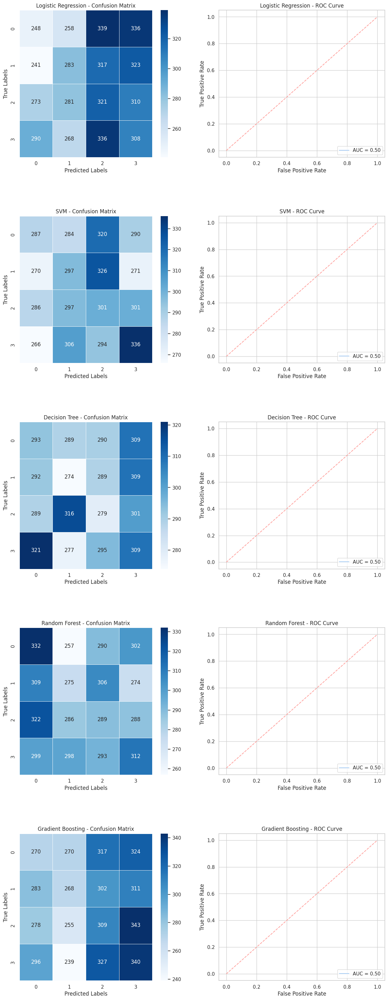

In [16]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
# lung_cancer_data = pd.read_csv('path_to_your_data.csv')

# Define numerical and categorical columns
numerical_cols = ['Age', 'Tumor_Size_mm', 'Blood_Pressure_Systolic', 'Hemoglobin_Level', 'White_Blood_Cell_Count']
categorical_cols = ['Gender', 'Smoking_History', 'Treatment', 'Ethnicity']

# Features and target
X = lung_cancer_data[numerical_cols + categorical_cols]
y = lung_cancer_data['Stage']  # Ensure 'Stage' is properly encoded as integers

# Preprocessing
numerical_transformer = StandardScaler()
categorical_transformer = OneHotEncoder(handle_unknown='ignore')
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Models
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'SVM': SVC(probability=True),  # for ROC
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(n_estimators=100),
    'Gradient Boosting': GradientBoostingClassifier()
}

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

# Visualization setup
fig, axes = plt.subplots(nrows=len(models), ncols=2, figsize=(15, 8 * len(models)))
plt.subplots_adjust(hspace=0.4)

for i, (name, model) in enumerate(models.items()):
    pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('model', model)])
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)
    y_proba = pipeline.predict_proba(X_test) if hasattr(model, "predict_proba") else None

    # Metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    roc_auc = roc_auc_score(y_test, y_proba, multi_class='ovo', average='macro') if y_proba is not None else 'N/A'
    cm = confusion_matrix(y_test, y_pred)

    # Classification report
    print(f"{name} Classification Report:\n")
    print(classification_report(y_test, y_pred))

    # Confusion matrix
    sns.heatmap(cm, annot=True, fmt="d", linewidths=.5, ax=axes[i, 0], cmap='Blues')
    axes[i, 0].set_title(f'{name} - Confusion Matrix')
    axes[i, 0].set_xlabel('Predicted Labels')
    axes[i, 0].set_ylabel('True Labels')

    # ROC Curve
    if y_proba is not None:
        fpr, tpr, _ = roc_curve(y_test, y_proba[:, 1], pos_label=1)
        axes[i, 1].plot(fpr, tpr, label=f'AUC = {roc_auc:.2f}')
        axes[i, 1].plot([0, 1], [0, 1], 'r--')
        axes[i, 1].set_title(f'{name} - ROC Curve')
        axes[i, 1].set_xlabel('False Positive Rate')
        axes[i, 1].set_ylabel('True Positive Rate')
        axes[i, 1].legend(loc='lower right')

plt.show()

Training Logistic Regression...
Fitting 2 folds for each of 5 candidates, totalling 10 fits
Logistic Regression Classification Report:

              precision    recall  f1-score   support

     Stage I       0.33      0.59      0.42        54
    Stage II       0.14      0.06      0.09        47
   Stage III       0.31      0.31      0.31        49
    Stage IV       0.29      0.18      0.22        50

    accuracy                           0.29       200
   macro avg       0.26      0.29      0.26       200
weighted avg       0.27      0.29      0.26       200



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:307: UserWarning: The total space of parameters 4 is smaller than n_iter=5. Running 4 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Training SVM...
Fitting 2 folds for each of 4 candidates, totalling 8 fits
SVM Classification Report:

              precision    recall  f1-score   support

     Stage I       0.24      0.43      0.31        54
    Stage II       0.15      0.11      0.12        47
   Stage III       0.26      0.18      0.22        49
    Stage IV       0.24      0.18      0.21        50

    accuracy                           0.23       200
   macro avg       0.22      0.22      0.21       200
weighted avg       0.23      0.23      0.22       200



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


Training Decision Tree...
Fitting 2 folds for each of 5 candidates, totalling 10 fits
Decision Tree Classification Report:

              precision    recall  f1-score   support

     Stage I       0.26      0.26      0.26        54
    Stage II       0.25      0.26      0.25        47
   Stage III       0.22      0.22      0.22        49
    Stage IV       0.31      0.30      0.31        50

    accuracy                           0.26       200
   macro avg       0.26      0.26      0.26       200
weighted avg       0.26      0.26      0.26       200



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


Training Random Forest...
Fitting 2 folds for each of 5 candidates, totalling 10 fits
Random Forest Classification Report:

              precision    recall  f1-score   support

     Stage I       0.24      0.28      0.26        54
    Stage II       0.15      0.13      0.14        47
   Stage III       0.27      0.29      0.28        49
    Stage IV       0.20      0.18      0.19        50

    accuracy                           0.22       200
   macro avg       0.21      0.22      0.22       200
weighted avg       0.22      0.22      0.22       200



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


Training Gradient Boosting...
Fitting 2 folds for each of 5 candidates, totalling 10 fits
Gradient Boosting Classification Report:

              precision    recall  f1-score   support

     Stage I       0.25      0.33      0.29        54
    Stage II       0.18      0.19      0.19        47
   Stage III       0.29      0.27      0.28        49
    Stage IV       0.32      0.22      0.26        50

    accuracy                           0.26       200
   macro avg       0.26      0.25      0.25       200
weighted avg       0.26      0.26      0.25       200



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


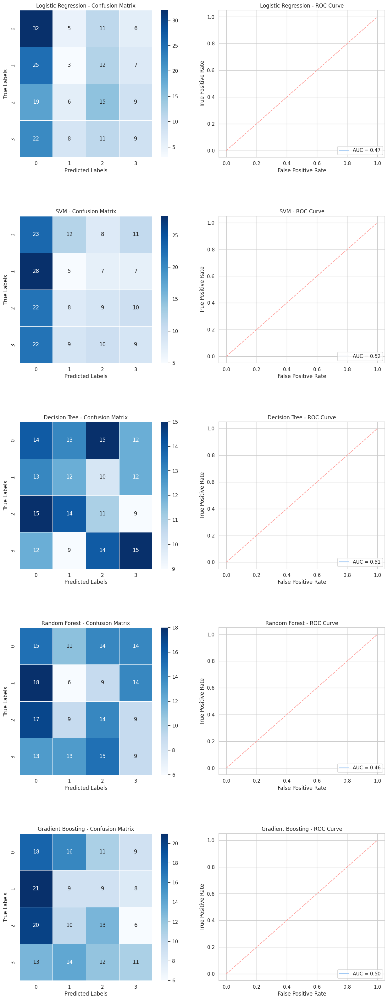

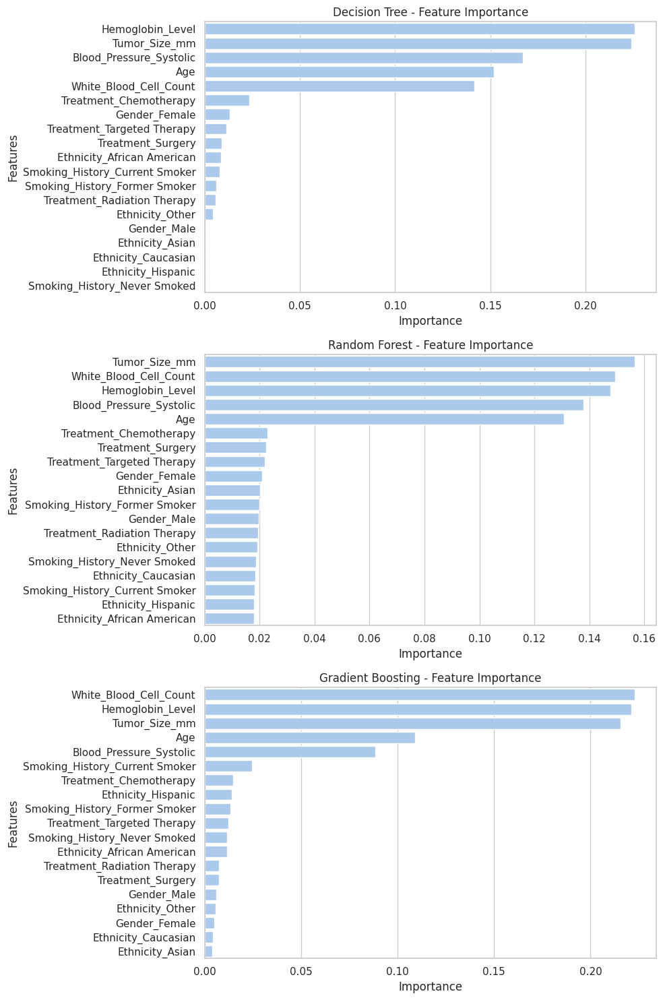

In [18]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import randint as sp_randint

# Load dataset
# lung_cancer_data = pd.read_csv('path_to_your_data.csv')

# Sample 1000 records from the dataset
lung_cancer_data_sample = lung_cancer_data.sample(n=1000, random_state=42)

# Define numerical and categorical columns
numerical_cols = ['Age', 'Tumor_Size_mm', 'Blood_Pressure_Systolic', 'Hemoglobin_Level', 'White_Blood_Cell_Count']
categorical_cols = ['Gender', 'Smoking_History', 'Treatment', 'Ethnicity']

# Features and target
X = lung_cancer_data_sample[numerical_cols + categorical_cols]
y = lung_cancer_data_sample['Stage']  # Ensure 'Stage' is properly encoded as integers

# Preprocessing
numerical_transformer = StandardScaler()
categorical_transformer = OneHotEncoder(handle_unknown='ignore')
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Define parameter distributions for RandomizedSearchCV
param_dist_rf = {
    'model__n_estimators': [100, 200],  # Reduced number of estimators
    'model__max_depth': [None, 10, 20],  # Reduced range
    'model__min_samples_split': [2, 5],  # Fewer options
    'model__min_samples_leaf': [1, 4]    # Fewer options
}

param_dist_svm = {
    'model__C': [1, 10],  # Reduced range of C
    'model__kernel': ['rbf', 'linear']  # Reduced kernel options
}

param_dist_lr = {
    'model__C': [0.01, 0.1, 1, 10],  # Range of C for Logistic Regression
    'model__solver': ['lbfgs', 'liblinear']  # Solvers to test
}

param_dist_dt = {
    'model__max_depth': [None, 10, 20],
    'model__min_samples_split': [2, 5],
    'model__min_samples_leaf': [1, 4]
}

param_dist_gb = {
    'model__n_estimators': [100, 200],
    'model__learning_rate': [0.01, 0.1, 0.2],
    'model__max_depth': [3, 5, 7]
}

# Models with RandomizedSearchCV
models = {
    'Logistic Regression': RandomizedSearchCV(
        Pipeline(steps=[('preprocessor', preprocessor), ('model', LogisticRegression(max_iter=1000))]),
        param_distributions=param_dist_lr, n_iter=5, cv=2, verbose=1, random_state=42, n_jobs=-1
    ),
    'SVM': RandomizedSearchCV(
        Pipeline(steps=[('preprocessor', preprocessor), ('model', SVC(probability=True))]),
        param_distributions=param_dist_svm, n_iter=5, cv=2, verbose=1, random_state=42, n_jobs=-1
    ),
    'Decision Tree': RandomizedSearchCV(
        Pipeline(steps=[('preprocessor', preprocessor), ('model', DecisionTreeClassifier())]),
        param_distributions=param_dist_dt, n_iter=5, cv=2, verbose=1, random_state=42, n_jobs=-1
    ),
    'Random Forest': RandomizedSearchCV(
        Pipeline(steps=[('preprocessor', preprocessor), ('model', RandomForestClassifier(random_state=42))]),
        param_distributions=param_dist_rf, n_iter=5, cv=2, verbose=1, random_state=42, n_jobs=-1
    ),
    'Gradient Boosting': RandomizedSearchCV(
        Pipeline(steps=[('preprocessor', preprocessor), ('model', GradientBoostingClassifier())]),
        param_distributions=param_dist_gb, n_iter=5, cv=2, verbose=1, random_state=42, n_jobs=-1
    )
}

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

# Visualization setup
fig, axes = plt.subplots(nrows=len(models), ncols=2, figsize=(15, 8 * len(models)))
plt.subplots_adjust(hspace=0.4)

feature_importances = {}

for i, (name, model) in enumerate(models.items()):
    # Fit the RandomizedSearchCV model
    print(f"Training {name}...")
    model.fit(X_train, y_train)
    pipeline = model.best_estimator_

    y_pred = pipeline.predict(X_test)
    y_proba = pipeline.predict_proba(X_test) if hasattr(pipeline.named_steps['model'], "predict_proba") else None

    # Metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    roc_auc = roc_auc_score(y_test, y_proba, multi_class='ovo', average='macro') if y_proba is not None else 'N/A'
    cm = confusion_matrix(y_test, y_pred)

    # Classification report
    print(f"{name} Classification Report:\n")
    print(classification_report(y_test, y_pred))

    # Confusion matrix
    sns.heatmap(cm, annot=True, fmt="d", linewidths=.5, ax=axes[i, 0], cmap='Blues')
    axes[i, 0].set_title(f'{name} - Confusion Matrix')
    axes[i, 0].set_xlabel('Predicted Labels')
    axes[i, 0].set_ylabel('True Labels')

    # ROC Curve
    if y_proba is not None:
        fpr, tpr, _ = roc_curve(y_test, y_proba[:, 1], pos_label=1)
        axes[i, 1].plot(fpr, tpr, label=f'AUC = {roc_auc:.2f}')
        axes[i, 1].plot([0, 1], [0, 1], 'r--')
        axes[i, 1].set_title(f'{name} - ROC Curve')
        axes[i, 1].set_xlabel('False Positive Rate')
        axes[i, 1].set_ylabel('True Positive Rate')
        axes[i, 1].legend(loc='lower right')

    # Feature Importance
    if hasattr(pipeline.named_steps['model'], "feature_importances_"):
        importances = pipeline.named_steps['model'].feature_importances_
        feature_names = numerical_cols + list(pipeline.named_steps['preprocessor'].named_transformers_['cat'].get_feature_names_out(categorical_cols))
        feature_importances[name] = pd.Series(importances, index=feature_names).sort_values(ascending=False)

# Plotting Feature Importances
fig_imp, ax_imp = plt.subplots(len(feature_importances), 1, figsize=(10, 5 * len(feature_importances)))
if len(feature_importances) == 1:
    ax_imp = [ax_imp]  # To ensure ax_imp is iterable even if there is only one model with feature importances

for i, (name, importance) in enumerate(feature_importances.items()):
    sns.barplot(x=importance, y=importance.index, ax=ax_imp[i])
    ax_imp[i].set_title(f'{name} - Feature Importance')
    ax_imp[i].set_xlabel('Importance')
    ax_imp[i].set_ylabel('Features')

plt.tight_layout()
plt.show()


# Treatment Efficacy Modelling

Training Logistic Regression...


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:14

Logistic Regression Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       963
           1       0.80      1.00      0.89      3769

    accuracy                           0.80      4732
   macro avg       0.40      0.50      0.44      4732
weighted avg       0.63      0.80      0.71      4732

Training SVM...


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:14

SVM Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       963
           1       0.80      1.00      0.89      3769

    accuracy                           0.80      4732
   macro avg       0.40      0.50      0.44      4732
weighted avg       0.63      0.80      0.71      4732

Training Decision Tree...
Decision Tree Classification Report:

              precision    recall  f1-score   support

           0       0.21      0.23      0.22       963
           1       0.80      0.78      0.79      3769

    accuracy                           0.67      4732
   macro avg       0.50      0.50      0.50      4732
weighted avg       0.68      0.67      0.67      4732

Training Random Forest...


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:14

Random Forest Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       963
           1       0.80      1.00      0.89      3769

    accuracy                           0.80      4732
   macro avg       0.40      0.50      0.44      4732
weighted avg       0.63      0.80      0.71      4732

Training Gradient Boosting...
Gradient Boosting Classification Report:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       963
           1       0.80      1.00      0.89      3769

    accuracy                           0.80      4732
   macro avg       0.40      0.50      0.44      4732
weighted avg       0.63      0.80      0.71      4732



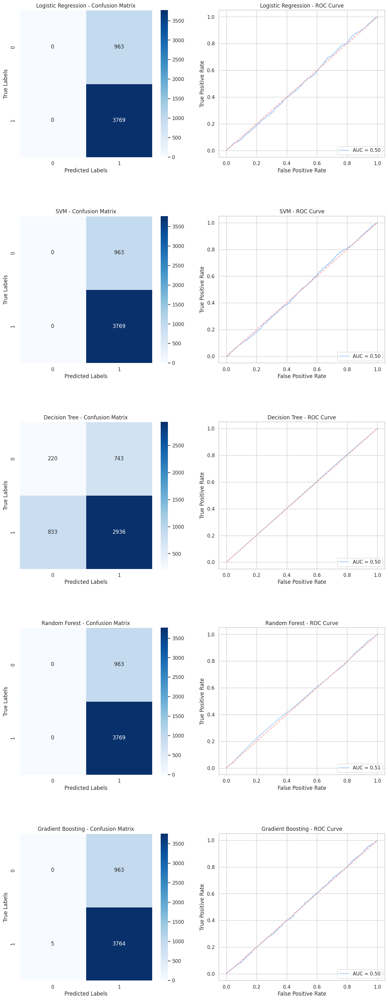

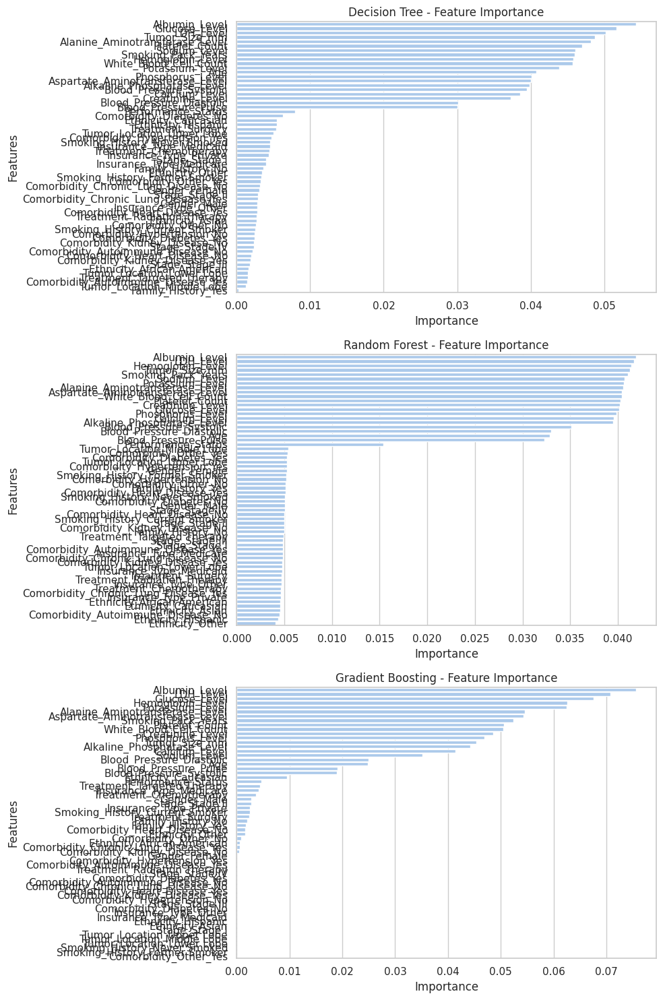

In [20]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import seaborn as sns

# Sample 50% of the data
lung_cancer_data_sample = lung_cancer_data.sample(frac=0.5, random_state=42)

# Define the target variable - e.g., Survival_Months > 24 indicates treatment efficacy
lung_cancer_data['Treatment_Efficacy'] = np.where(lung_cancer_data['Survival_Months'] > 24, 1, 0)

# Define features and target
X = lung_cancer_data.drop(columns=['Survival_Months', 'Treatment_Efficacy'])  # Exclude target and survival time from features
y = lung_cancer_data['Treatment_Efficacy']

# Split numerical and categorical columns
numerical_cols = X.select_dtypes(include=['int64', 'float32']).columns.tolist()
categorical_cols = X.select_dtypes(include=['category']).columns.tolist()

# Preprocessing
numerical_transformer = StandardScaler()
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Define models
models = {
    'Logistic Regression': Pipeline(steps=[('preprocessor', preprocessor), ('model', LogisticRegression(max_iter=1000))]),
    'SVM': Pipeline(steps=[('preprocessor', preprocessor), ('model', SVC(probability=True))]),
    'Decision Tree': Pipeline(steps=[('preprocessor', preprocessor), ('model', DecisionTreeClassifier())]),
    'Random Forest': Pipeline(steps=[('preprocessor', preprocessor), ('model', RandomForestClassifier(random_state=42))]),
    'Gradient Boosting': Pipeline(steps=[('preprocessor', preprocessor), ('model', GradientBoostingClassifier())])
}

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

# Visualization setup
fig, axes = plt.subplots(nrows=len(models), ncols=2, figsize=(15, 8 * len(models)))
plt.subplots_adjust(hspace=0.4)

feature_importances = {}

for i, (name, model) in enumerate(models.items()):
    # Train the model
    print(f"Training {name}...")
    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test) if hasattr(model.named_steps['model'], "predict_proba") else None

    # Metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    roc_auc = roc_auc_score(y_test, y_proba[:, 1]) if y_proba is not None else 'N/A'
    cm = confusion_matrix(y_test, y_pred)

    # Classification report
    print(f"{name} Classification Report:\n")
    print(classification_report(y_test, y_pred))

    # Confusion matrix
    sns.heatmap(cm, annot=True, fmt="d", linewidths=.5, ax=axes[i, 0], cmap='Blues')
    axes[i, 0].set_title(f'{name} - Confusion Matrix')
    axes[i, 0].set_xlabel('Predicted Labels')
    axes[i, 0].set_ylabel('True Labels')

    # ROC Curve
    if y_proba is not None:
        fpr, tpr, _ = roc_curve(y_test, y_proba[:, 1])
        axes[i, 1].plot(fpr, tpr, label=f'AUC = {roc_auc:.2f}')
        axes[i, 1].plot([0, 1], [0, 1], 'r--')
        axes[i, 1].set_title(f'{name} - ROC Curve')
        axes[i, 1].set_xlabel('False Positive Rate')
        axes[i, 1].set_ylabel('True Positive Rate')
        axes[i, 1].legend(loc='lower right')

    # Feature Importance
    if hasattr(model.named_steps['model'], "feature_importances_"):
        importances = model.named_steps['model'].feature_importances_
        feature_names = numerical_cols + list(model.named_steps['preprocessor'].named_transformers_['cat'].get_feature_names_out(categorical_cols))
        feature_importances[name] = pd.Series(importances, index=feature_names).sort_values(ascending=False)

# Plotting Feature Importances
fig_imp, ax_imp = plt.subplots(len(feature_importances), 1, figsize=(10, 5 * len(feature_importances)))
if len(feature_importances) == 1:
    ax_imp = [ax_imp]  # To ensure ax_imp is iterable even if there is only one model with feature importances

for i, (name, importance) in enumerate(feature_importances.items()):
    sns.barplot(x=importance, y=importance.index, ax=ax_imp[i])
    ax_imp[i].set_title(f'{name} - Feature Importance')
    ax_imp[i].set_xlabel('Importance')
    ax_imp[i].set_ylabel('Features')

plt.tight_layout()
plt.show()

<ipython-input-22-6ccc75b6a1f9>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette="Blues_d")


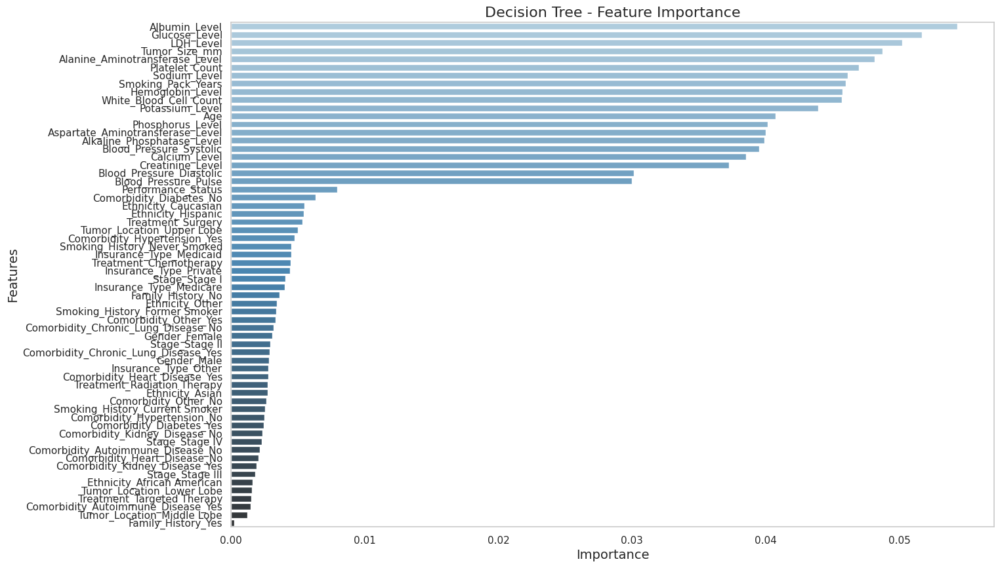

<ipython-input-22-6ccc75b6a1f9>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette="Blues_d")


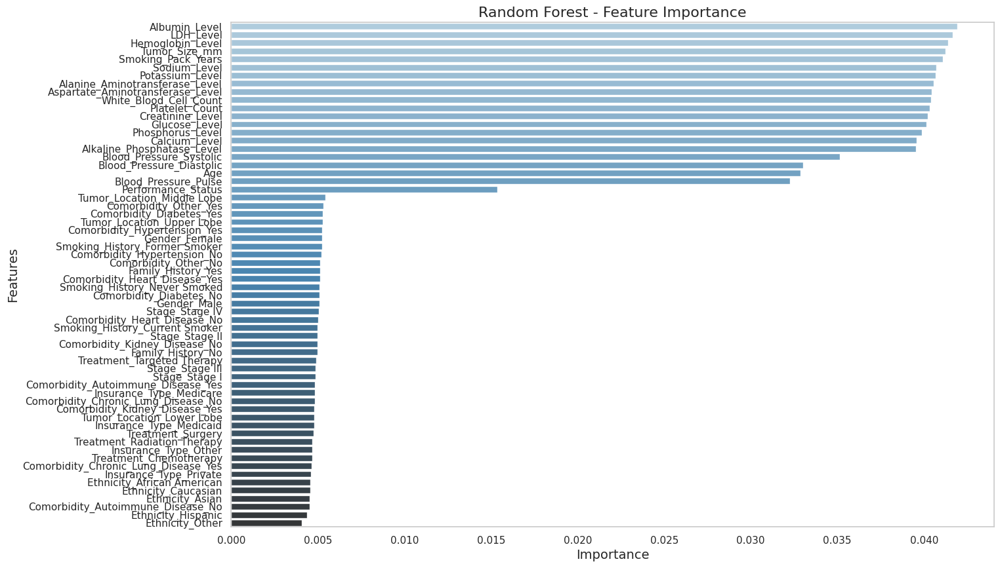

<ipython-input-22-6ccc75b6a1f9>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances.values, y=importances.index, palette="Blues_d")


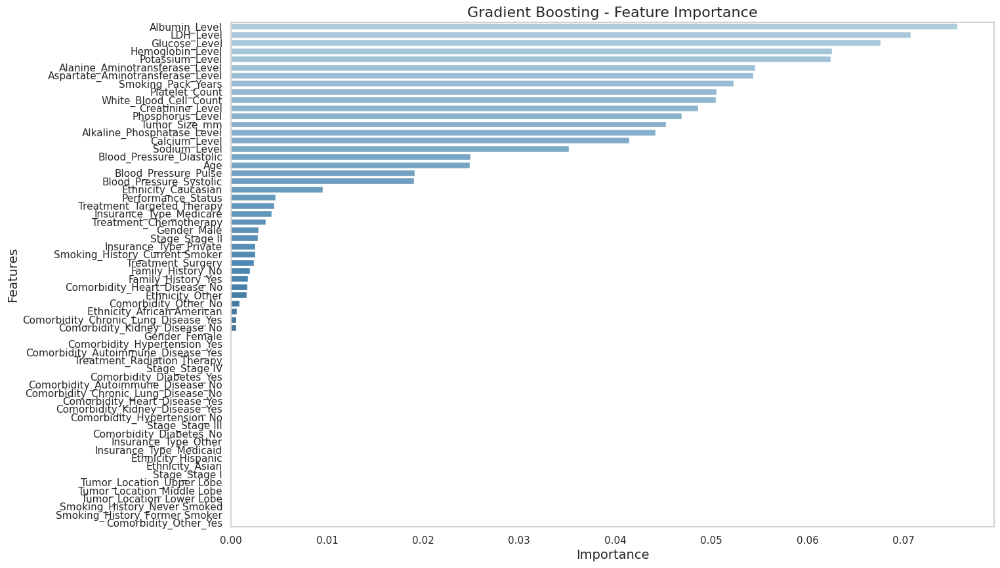

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

# Improved plotting of Feature Importances
def plot_feature_importance(importances, title):
    plt.figure(figsize=(15, 10))
    sns.barplot(x=importances.values, y=importances.index, palette="Blues_d")
    plt.title(title, fontsize=16)
    plt.xlabel('Importance', fontsize=14)
    plt.ylabel('Features', fontsize=14)
    plt.grid(axis='x')
    plt.show()

# Assuming 'feature_importances' is a dictionary containing feature importance for different models
for name, importance in feature_importances.items():
    plot_feature_importance(importance, f'{name} - Feature Importance')

# Survival Analysis

In [25]:
!pip install lifelines

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 349.3/349.3 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.5/94.5 kB 5.4 MB/s eta 0:00:00
  Created wheel for autograd-gamma: filename=autograd_gamma-0.5.0-py3-none-any.whl size=4031 sha256=ba319fde0832e5e7676222def10f25d61cd5fc112e204993703e095699c8ef78
  Stored in directory: /root/.cache/pip/wheels/25/cc/e0/ef2969164144c899fedb22b338f6703e2b9cf46eeebf254991
Successfully built autograd-gamma


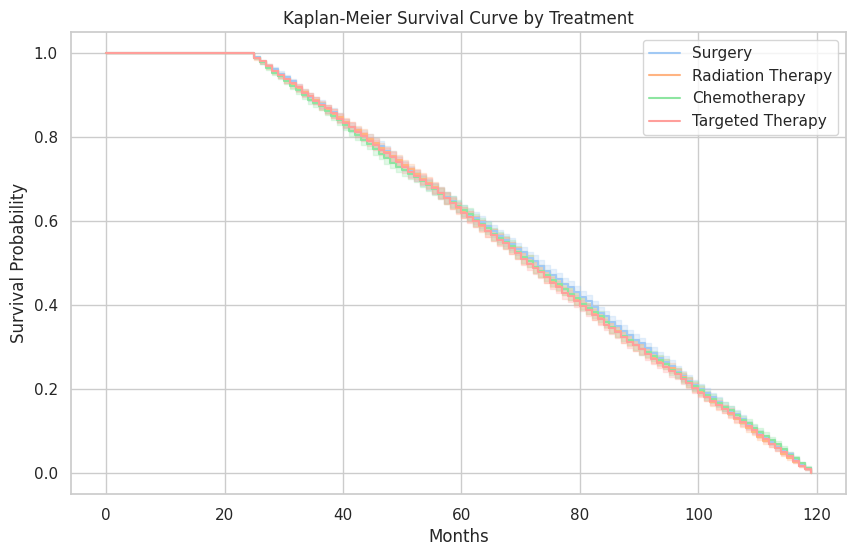

<lifelines.CoxPHFitter: fitted with 23658 total observations, 4813 right-censored observations>
             duration col = 'Survival_Months'
                event col = 'Treatment_Efficacy'
      baseline estimation = breslow
   number of observations = 23658
number of events observed = 18845
   partial log-likelihood = -166643.23
         time fit was run = 2024-09-03 19:28:38 UTC

---
                                       coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                                                    
Age                                   -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Tumor_Size_mm                         -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Performance_Status                     0.01       1.01       0.01            -0.00             0.02                 1.00                 1.02
Blood_Pressure_Systolic               -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Blood_Pressure_Diastolic              -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Blood_Pressure_Pulse                   0.00       1.00       0.00             0.00             0.00                 1.00                 1.00
Hemoglobin_Level                      -0.00       1.00       0.00            -0.01             0.00                 0.99                 1.00
White_Blood_Cell_Count                -0.01       0.99       0.00            -0.02            -0.00                 0.98                 1.00
Platelet_Count                         0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Albumin_Level                          0.02       1.02       0.01            -0.01             0.04                 0.99                 1.04
Alkaline_Phosphatase_Level            -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Alanine_Aminotransferase_Level         0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Aspartate_Aminotransferase_Level      -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Creatinine_Level                      -0.03       0.97       0.03            -0.08             0.02                 0.92                 1.02
LDH_Level                              0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Calcium_Level                          0.02       1.02       0.01            -0.00             0.04                 1.00                 1.04
Phosphorus_Level                      -0.01       0.99       0.01            -0.03             0.01                 0.97                 1.01
Glucose_Level                          0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Potassium_Level                       -0.01       0.99       0.02            -0.05             0.02                 0.96                 1.02
Sodium_Level                           0.00       1.00       0.00            -0.00             0.01                 1.00                 1.01
Smoking_Pack_Years                     0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Gender_Male                            0.01       1.01       0.01            -0.01             0.04                 0.99                 1.04
Smoking_History_Former Smoker          0.00       1.00       0.02            -0.03             0.04                 0.97                 1.04
Smoking_History_Never Smoked           0.00       1.00     

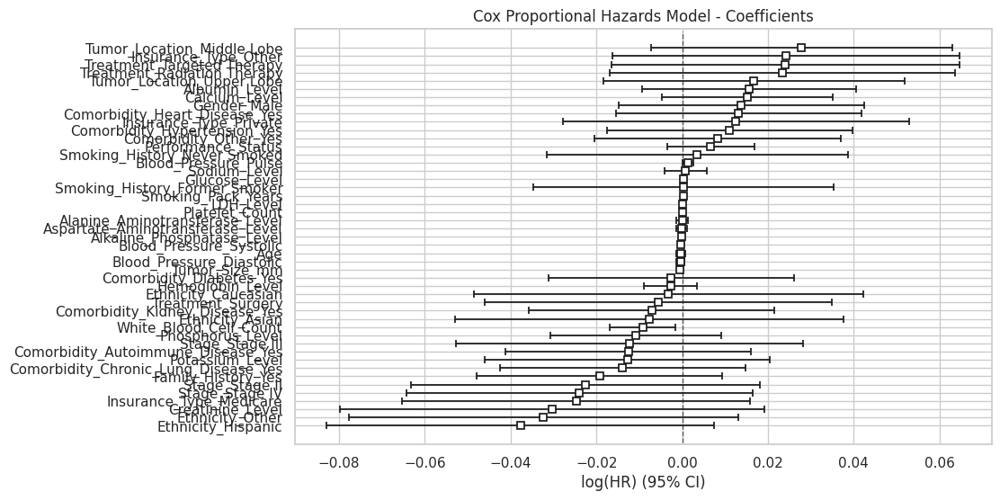

KeyError: 'covariate `Treatment` is not present in the original dataset'

<Figure size 1200x800 with 0 Axes>

In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from lifelines import KaplanMeierFitter, CoxPHFitter

# Assume lung_cancer_data is loaded

# Kaplan-Meier Estimation

# Define groups based on a categorical variable, e.g., Treatment
kmf = KaplanMeierFitter()

# For example, analyze survival based on the 'Treatment' group
treatment_groups = lung_cancer_data['Treatment'].unique()

plt.figure(figsize=(10, 6))
for treatment in treatment_groups:
    group = lung_cancer_data[lung_cancer_data['Treatment'] == treatment]
    kmf.fit(durations=group['Survival_Months'], event_observed=group['Treatment_Efficacy'], label=treatment)
    kmf.plot_survival_function()

plt.title('Kaplan-Meier Survival Curve by Treatment')
plt.xlabel('Months')
plt.ylabel('Survival Probability')
plt.grid(True)
plt.show()

# Cox Proportional Hazards Model

# Ensure categorical variables are encoded properly (e.g., OneHotEncoding)
lung_cancer_data_encoded = pd.get_dummies(lung_cancer_data, drop_first=True)

# Prepare the dataset for Cox model, including 'Treatment_Efficacy'
df_cox = lung_cancer_data_encoded[['Survival_Months', 'Treatment_Efficacy'] + [col for col in lung_cancer_data_encoded.columns if col not in ['Survival_Months', 'Treatment_Efficacy']]]

# Fit the Cox model
cph = CoxPHFitter()
cph.fit(df_cox, duration_col='Survival_Months', event_col='Treatment_Efficacy')

# Print summary
cph.print_summary()

# Plot the Cox model coefficients
plt.figure(figsize=(10, 6))
cph.plot()
plt.title('Cox Proportional Hazards Model - Coefficients')
plt.show()

# Plot Partial Effects of Covariates
plt.figure(figsize=(15, 10))
cph.plot_partial_effects_on_outcome(covariates=['Treatment'], values=['Treatment_A', 'Treatment_B', 'Treatment_C'])
plt.title('Partial Effects of Treatment on Survival')
plt.show()


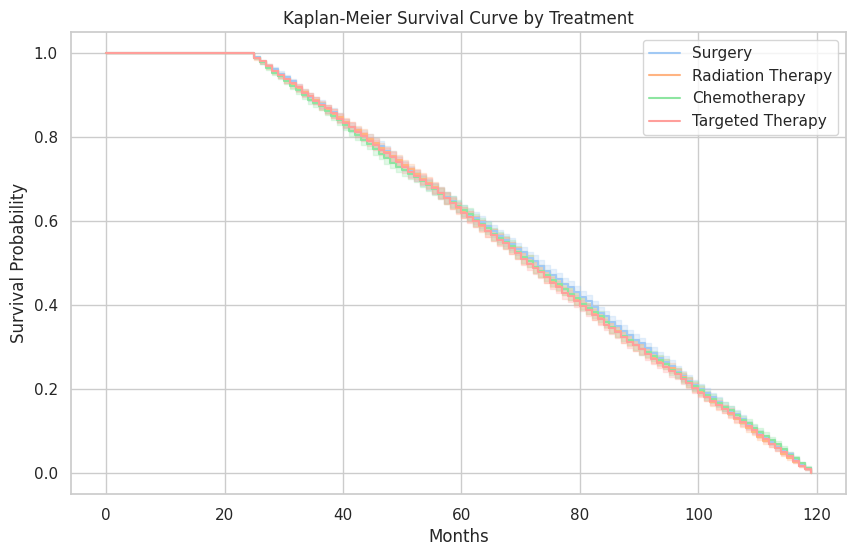

<lifelines.CoxPHFitter: fitted with 23658 total observations, 4813 right-censored observations>
             duration col = 'Survival_Months'
                event col = 'Treatment_Efficacy'
      baseline estimation = breslow
   number of observations = 23658
number of events observed = 18845
   partial log-likelihood = -166643.23
         time fit was run = 2024-09-03 19:30:10 UTC

---
                                       coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                                                    
Age                                   -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Tumor_Size_mm                         -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Performance_Status                     0.01       1.01       0.01            -0.00             0.02                 1.00                 1.02
Blood_Pressure_Systolic               -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Blood_Pressure_Diastolic              -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Blood_Pressure_Pulse                   0.00       1.00       0.00             0.00             0.00                 1.00                 1.00
Hemoglobin_Level                      -0.00       1.00       0.00            -0.01             0.00                 0.99                 1.00
White_Blood_Cell_Count                -0.01       0.99       0.00            -0.02            -0.00                 0.98                 1.00
Platelet_Count                         0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Albumin_Level                          0.02       1.02       0.01            -0.01             0.04                 0.99                 1.04
Alkaline_Phosphatase_Level            -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Alanine_Aminotransferase_Level         0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Aspartate_Aminotransferase_Level      -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Creatinine_Level                      -0.03       0.97       0.03            -0.08             0.02                 0.92                 1.02
LDH_Level                              0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Calcium_Level                          0.02       1.02       0.01            -0.00             0.04                 1.00                 1.04
Phosphorus_Level                      -0.01       0.99       0.01            -0.03             0.01                 0.97                 1.01
Glucose_Level                          0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Potassium_Level                       -0.01       0.99       0.02            -0.05             0.02                 0.96                 1.02
Sodium_Level                           0.00       1.00       0.00            -0.00             0.01                 1.00                 1.01
Smoking_Pack_Years                     0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Gender_Male                            0.01       1.01       0.01            -0.01             0.04                 0.99                 1.04
Smoking_History_Former Smoker          0.00       1.00       0.02            -0.03             0.04                 0.97                 1.04
Smoking_History_Never Smoked           0.00       1.00     

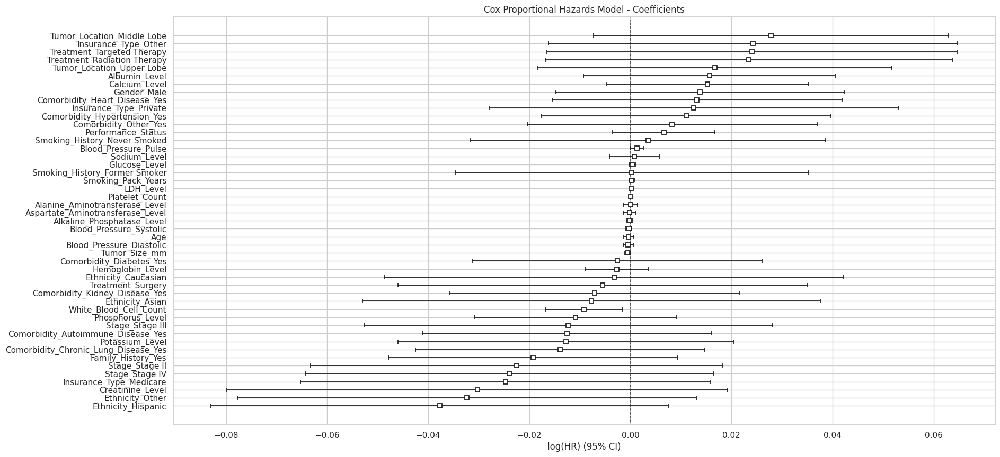

In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from lifelines import KaplanMeierFitter, CoxPHFitter

# Assume lung_cancer_data is loaded

# Kaplan-Meier Estimation

# Define groups based on a categorical variable, e.g., Treatment
kmf = KaplanMeierFitter()

# For example, analyze survival based on the 'Treatment' group
treatment_groups = lung_cancer_data['Treatment'].unique()

plt.figure(figsize=(10, 6))
for treatment in treatment_groups:
    group = lung_cancer_data[lung_cancer_data['Treatment'] == treatment]
    kmf.fit(durations=group['Survival_Months'], event_observed=group['Treatment_Efficacy'], label=treatment)
    kmf.plot_survival_function()

plt.title('Kaplan-Meier Survival Curve by Treatment')
plt.xlabel('Months')
plt.ylabel('Survival Probability')
plt.grid(True)
plt.show()

# Cox Proportional Hazards Model

# Ensure categorical variables are encoded properly (e.g., OneHotEncoding)
lung_cancer_data_encoded = pd.get_dummies(lung_cancer_data, drop_first=True)

# Prepare the dataset for Cox model, including 'Treatment_Efficacy'
df_cox = lung_cancer_data_encoded[['Survival_Months', 'Treatment_Efficacy'] + [col for col in lung_cancer_data_encoded.columns if col not in ['Survival_Months', 'Treatment_Efficacy']]]

# Fit the Cox model
cph = CoxPHFitter()
cph.fit(df_cox, duration_col='Survival_Months', event_col='Treatment_Efficacy')

# Print summary
cph.print_summary()

# Plot the Cox model coefficients
plt.figure(figsize=(20, 10))
cph.plot()
plt.title('Cox Proportional Hazards Model - Coefficients')
plt.show()

# Identify the one-hot encoded treatment columns
treatment_columns = [col for col in df_cox.columns if 'Treatment_' in col]


Significant Chi-Square Results:
{'Ethnicity': 0.035972054285303076}


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


Significant T-Test Results:
{'Blood_Pressure_Systolic': 0.038894575423271766, 'Creatinine_Level': 0.022509656899295894, 'Treatment_Efficacy': 0.0}
Top Logistic Regression Coefficients:
Insurance_Type_Private                  0.096259
Ethnicity_Other                         0.061797
Stage_Stage III                         0.054175
Insurance_Type_Other                    0.050606
Ethnicity_Hispanic                      0.043888
Comorbidity_Kidney_Disease_Yes          0.041404
Tumor_Location_Upper Lobe               0.039684
Comorbidity_Chronic_Lung_Disease_Yes    0.037929
Ethnicity_Asian                         0.031183
Comorbidity_Heart_Disease_Yes           0.031069
dtype: float64
Top Random Forest Feature Importances:
White_Blood_Cell_Count              0.044897
Creatinine_Level                    0.044418
Albumin_Level                       0.044346
Hemoglobin_Level                    0.044122
Platelet_Count                      0.043761
Aspartate_Aminotransferase_Level    0.043541
S

<ipython-input-33-5bcf94ec7725>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=log_reg_coefficients.head(10), y=log_reg_coefficients.head(10).index, palette="Blues_d")


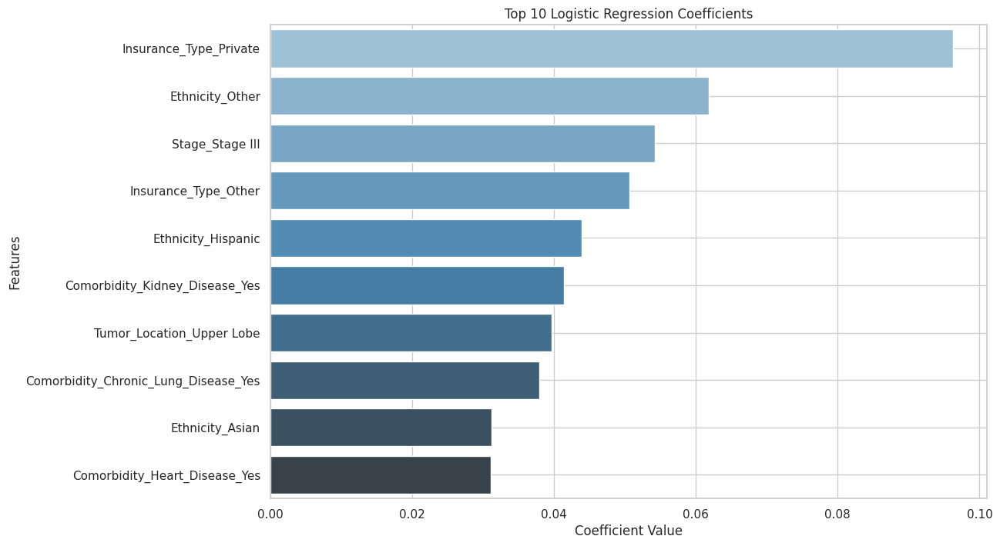

<ipython-input-33-5bcf94ec7725>:91: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=rf_feature_importances.head(10), y=rf_feature_importances.head(10).index, palette="Blues_d")


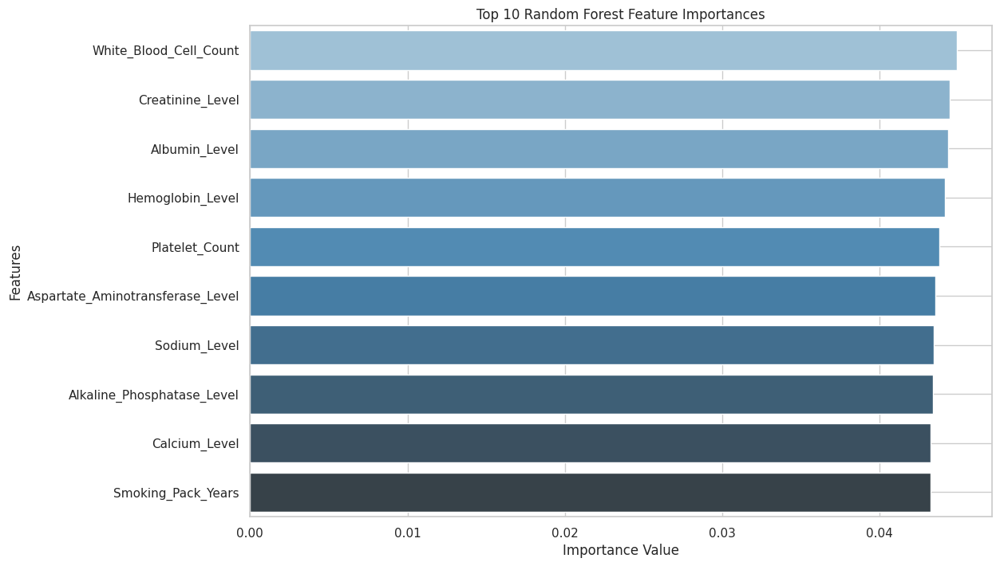

<lifelines.CoxPHFitter: fitted with 23658 total observations, 4813 right-censored observations>
             duration col = 'Survival_Months'
                event col = 'Treatment_Efficacy'
      baseline estimation = breslow
   number of observations = 23658
number of events observed = 18845
   partial log-likelihood = -166643.23
         time fit was run = 2024-09-03 19:33:10 UTC

---
                                       coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                                                    
Age                                   -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Tumor_Size_mm                         -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Performance_Status                     0.01       1.01       0.01            -0.00             0.02                 1.00                 1.02
Blood_Pressure_Systolic               -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Blood_Pressure_Diastolic              -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Blood_Pressure_Pulse                   0.00       1.00       0.00             0.00             0.00                 1.00                 1.00
Hemoglobin_Level                      -0.00       1.00       0.00            -0.01             0.00                 0.99                 1.00
White_Blood_Cell_Count                -0.01       0.99       0.00            -0.02            -0.00                 0.98                 1.00
Platelet_Count                         0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Albumin_Level                          0.02       1.02       0.01            -0.01             0.04                 0.99                 1.04
Alkaline_Phosphatase_Level            -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Alanine_Aminotransferase_Level         0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Aspartate_Aminotransferase_Level      -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Creatinine_Level                      -0.03       0.97       0.03            -0.08             0.02                 0.92                 1.02
LDH_Level                              0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Calcium_Level                          0.02       1.02       0.01            -0.00             0.04                 1.00                 1.04
Phosphorus_Level                      -0.01       0.99       0.01            -0.03             0.01                 0.97                 1.01
Glucose_Level                          0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Potassium_Level                       -0.01       0.99       0.02            -0.05             0.02                 0.96                 1.02
Sodium_Level                           0.00       1.00       0.00            -0.00             0.01                 1.00                 1.01
Smoking_Pack_Years                     0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
Gender_Male                            0.01       1.01       0.01            -0.01             0.04                 0.99                 1.04
Smoking_History_Former Smoker          0.00       1.00       0.02            -0.03             0.04                 0.97                 1.04
Smoking_History_Never Smoked           0.00       1.00     

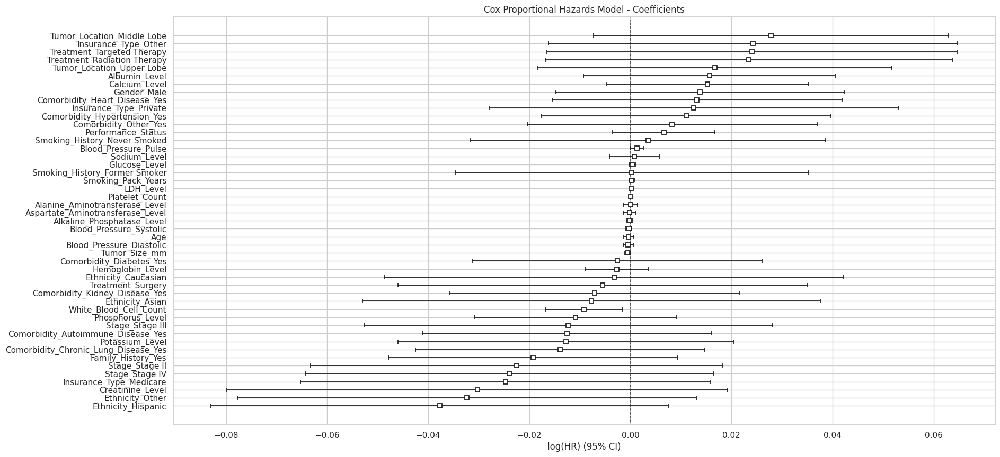

In [33]:
import pandas as pd
import numpy as np
import scipy.stats as stats
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
import seaborn as sns
from lifelines import CoxPHFitter

# Assume lung_cancer_data is loaded

# Encode categorical variables using one-hot encoding
lung_cancer_data_encoded = pd.get_dummies(lung_cancer_data, drop_first=True)

# Risk Factor Analysis

# Step 1: Statistical Tests
## Chi-Square Test for Categorical Variables
categorical_vars = lung_cancer_data.select_dtypes(include=['category']).columns

chi2_results = {}
for var in categorical_vars:
    contingency_table = pd.crosstab(lung_cancer_data[var], lung_cancer_data['Treatment_Efficacy'])
    chi2, p, dof, ex = stats.chi2_contingency(contingency_table)
    chi2_results[var] = p

# Display significant chi-square results (p < 0.05)
significant_chi2 = {k: v for k, v in chi2_results.items() if v < 0.05}
print("Significant Chi-Square Results:")
print(significant_chi2)

## T-Test/ANOVA for Continuous Variables
continuous_vars = lung_cancer_data.select_dtypes(include=['float32', 'int64']).columns.drop(['Survival_Months'])

ttest_results = {}
for var in continuous_vars:
    group1 = lung_cancer_data[lung_cancer_data['Treatment_Efficacy'] == 0][var]
    group2 = lung_cancer_data[lung_cancer_data['Treatment_Efficacy'] == 1][var]
    t_stat, p = stats.ttest_ind(group1, group2)
    ttest_results[var] = p

# Display significant t-test results (p < 0.05)
significant_ttest = {k: v for k, v in ttest_results.items() if v < 0.05}
print("Significant T-Test Results:")
print(significant_ttest)

# Step 2: Machine Learning Models

# Define features and target
X = lung_cancer_data_encoded.drop(columns=['Survival_Months', 'Treatment_Efficacy'])  # Exclude survival time and target
y = lung_cancer_data_encoded['Treatment_Efficacy']

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Define the models
log_reg = LogisticRegression(max_iter=1000)
rf_clf = RandomForestClassifier(random_state=42)

# Train Logistic Regression and Random Forest
log_reg.fit(X_train, y_train)
rf_clf.fit(X_train, y_train)

# Logistic Regression Coefficients
log_reg_coefficients = pd.Series(log_reg.coef_[0], index=X.columns).sort_values(ascending=False)

# Random Forest Feature Importances
rf_feature_importances = pd.Series(rf_clf.feature_importances_, index=X.columns).sort_values(ascending=False)

# Display top features
print("Top Logistic Regression Coefficients:")
print(log_reg_coefficients.head(10))

print("Top Random Forest Feature Importances:")
print(rf_feature_importances.head(10))

# Plotting the top features
plt.figure(figsize=(12, 8))
sns.barplot(x=log_reg_coefficients.head(10), y=log_reg_coefficients.head(10).index, palette="Blues_d")
plt.title('Top 10 Logistic Regression Coefficients')
plt.xlabel('Coefficient Value')
plt.ylabel('Features')
plt.grid(True)
plt.show()

plt.figure(figsize=(12, 8))
sns.barplot(x=rf_feature_importances.head(10), y=rf_feature_importances.head(10).index, palette="Blues_d")
plt.title('Top 10 Random Forest Feature Importances')
plt.xlabel('Importance Value')
plt.ylabel('Features')
plt.grid(True)
plt.show()

# Step 3: Cox Proportional Hazards Model

# Fit the Cox model
cph = CoxPHFitter()
cph.fit(lung_cancer_data_encoded, duration_col='Survival_Months', event_col='Treatment_Efficacy')

# Print summary
cph.print_summary()

# Plot the Cox model coefficients
plt.figure(figsize=(20, 10))
cph.plot()
plt.title('Cox Proportional Hazards Model - Coefficients')
plt.show()